# Practical Application III: Comparing Classifiers

**Overview**: In this practical application, your goal is to compare the performance of the classifiers we encountered in this section, namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines.  We will utilize a dataset related to marketing bank products over the telephone.  



### Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  The data is from a Portugese banking institution and is a collection of the results of multiple marketing campaigns.  We will make use of the article accompanying the dataset [here](CRISP-DM-BANK.pdf) for more information on the data and features.



### Problem 1: Understanding the Data

To gain a better understanding of the data, please read the information provided in the UCI link above, and examine the **Materials and Methods** section of the paper.  How many marketing campaigns does this data represent?

This data represents 17 marketing campaigns. During  these phone campaigns, an attractive long-term deposit application, with good interest rates, was offered. For each contact,  a  large  number  of  attributes  was  stored and  if  there  was  a  success.

Lift is the most commonly used metric in marketing. Cumulative lift curve is a percentage graph that divides the population into deciles, in which population members
 are placed based on their predicted probability of response. 
The responder deciles are sorted with the highest reponders are put on the first decile

 The goal is to increase the efficiency of directed campaigns for long-term deposit subscriptions by reducing the number of contacts to do.

### Problem 2: Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

In [ ]:
# Data & Viz
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Profiling
from ydata_profiling import ProfileReport
from IPython.display import display, HTML

# ML Basics
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline

# Models
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from xgboost import XGBClassifier

# Oversampling
from imblearn.over_sampling import SMOTE, SMOTENC

# Metrics
from sklearn.metrics import (
    precision_score, recall_score, f1_score, roc_auc_score, accuracy_score,
    confusion_matrix, ConfusionMatrixDisplay, classification_report,
    matthews_corrcoef, log_loss, precision_recall_curve, roc_curve, auc, make_scorer
)

# Miscellaneous
import shap
import os
import time
import psutil


In [3]:
df = pd.read_csv('data/bank-additional-full.csv', sep = ';')

### Problem 3: Understanding the Features


Examine the data description below, and determine if any of the features are missing values or need to be coerced to a different data type.


```
Input variables:
# bank client data:
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
# related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
# other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
# social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



In [4]:
pd.set_option('display.max_columns', None)
print(df.head())
pd.reset_option('display.max_columns')

   age        job  marital    education  default housing loan    contact  \
0   56  housemaid  married     basic.4y       no      no   no  telephone   
1   57   services  married  high.school  unknown      no   no  telephone   
2   37   services  married  high.school       no     yes   no  telephone   
3   40     admin.  married     basic.6y       no      no   no  telephone   
4   56   services  married  high.school       no      no  yes  telephone   

  month day_of_week  duration  campaign  pdays  previous     poutcome  \
0   may         mon       261         1    999         0  nonexistent   
1   may         mon       149         1    999         0  nonexistent   
2   may         mon       226         1    999         0  nonexistent   
3   may         mon       151         1    999         0  nonexistent   
4   may         mon       307         1    999         0  nonexistent   

   emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed   y  
0           1.1          93

In [5]:
df = df.rename(columns = {
                            'emp.var.rate': 'emp_var_rate', 
                            'cons.price.idx': 'cons_price_idx', 
                            'cons.conf.idx': 'cons_conf_idx', 
                            'nr.employed': 'nr_employed'
                         }
              )

In [6]:
duplicates = df[df.duplicated()]
duplicates

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
20216,55,services,married,high.school,unknown,no,no,cellular,aug,mon,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
20534,41,technician,married,professional.course,no,yes,no,cellular,aug,tue,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no
25217,39,admin.,married,university.degree,no,no,no,cellular,nov,tue,...,2,999,0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,no
28477,24,services,single,high.school,no,yes,no,cellular,apr,tue,...,1,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,no
32516,35,admin.,married,university.degree,no,yes,no,cellular,may,fri,...,4,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no


In [7]:
df = df.drop_duplicates()

In [8]:
duplicates = df[df.duplicated()]
duplicates

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed,y


In [9]:
df_profile = ProfileReport(df,
                           correlations = {
                               "auto": {"calculate": True},
                               "pearson": {"calculate": True},
                               "spearman": {"calculate": True},
                               "kendall": {"calculate": True},
                               "phi_k": {"calculate": True},
                               "cramers": {"calculate": True},
                           }, 
                           duplicates = {"threshold": 1},

                           title = "Profiling Report", progress_bar = False, infer_dtypes = False
                           )

profile_html = df_profile.to_html()

display(HTML(profile_html))

c:\Users\kusha\anaconda3\Lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the pearson correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"pearson": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'housemaid'')
  warnings.warn(
c:\Users\kusha\anaconda3\Lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the spearman correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"spearman": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: '

Number of variables,21
Number of observations,41176
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,6.9 MiB
Average record size in memory,176.0 B
Numeric,10
Text,11
cons_price_idx is highly overall correlated with contact and 6 other fields,High correlation


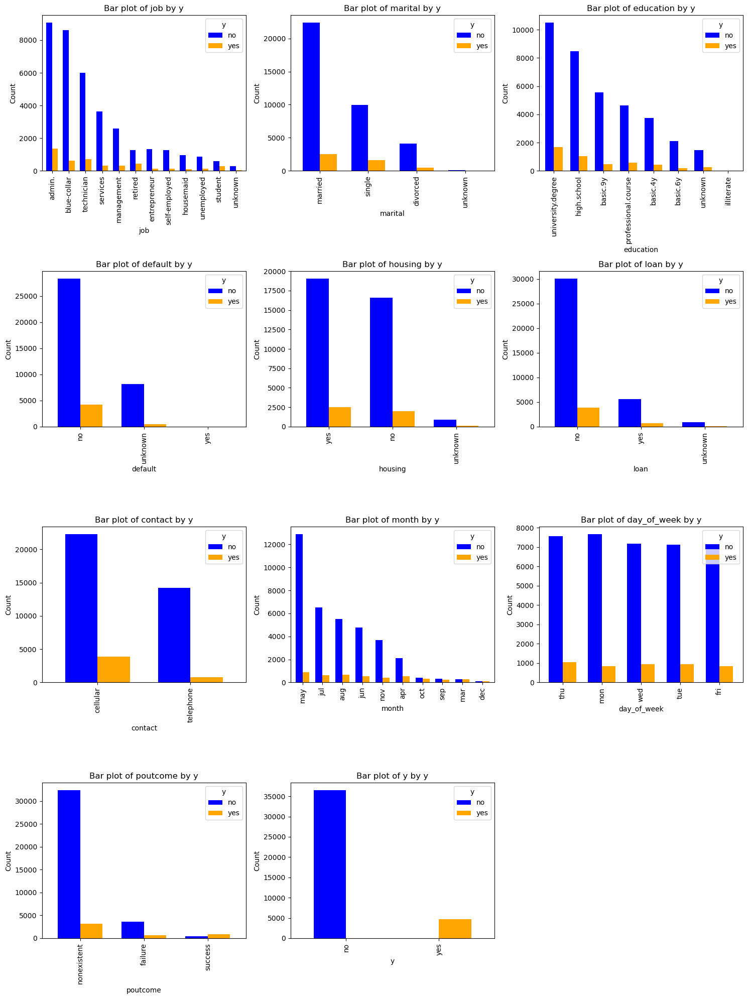

In [10]:
%matplotlib inline

categorical = df.select_dtypes(exclude = 'number').columns

n_cols = 3
n_rows = 4

fig, axes = plt.subplots(nrows = n_rows, ncols = n_cols, figsize = (15, 20))
axes = axes.flatten()
for index, column in enumerate(categorical):
    grouped_data = df.groupby([column, 'y'])['y'].count().unstack(fill_value = 0)
    grouped_data['total_count'] = grouped_data['no'] + grouped_data['yes']
    grouped_data = grouped_data.sort_values(by = 'total_count', ascending = False)
    grouped_data.drop(columns = 'total_count').plot(kind = 'bar', width = 0.7, color = ['blue', 'orange'], ax = axes[index])
    axes[index].set_title(f'Bar plot of {column} by y')
    axes[index].set_xlabel(column)
    axes[index].set_ylabel('Count')

# Tourn off empty subplots
for i in range(index + 1, len(axes)):
    axes[i].axis('off')
    
plt.tight_layout()
plt.show()
plt.close()

In [11]:
df['education'] = df['education'].replace({
    'basic.4y': '4y_basic', 
    'high.school': 'high_school', 
    'basic.6y': '6y_basic', 
    'basic.9y': '9y_basic',
    'professional.course': 'professional_course', 
    'unknown': 'unknown', 
    'university.degree': 'university_degree',
    'illiterate': 'illiterate'
})

In [12]:
for column_name in df.select_dtypes(include = 'number'):
    min_value = df[column_name].min()
    max_value = df[column_name].max()
    print(f'Min Value of {column_name}: {min_value}')
    print(f'Max Value of {column_name}: {max_value}')

Min Value of age: 17
Max Value of age: 98
Min Value of duration: 0
Max Value of duration: 4918
Min Value of campaign: 1
Max Value of campaign: 56
Min Value of pdays: 0
Max Value of pdays: 999
Min Value of previous: 0
Max Value of previous: 7
Min Value of emp_var_rate: -3.4
Max Value of emp_var_rate: 1.4
Min Value of cons_price_idx: 92.201
Max Value of cons_price_idx: 94.767
Min Value of cons_conf_idx: -50.8
Max Value of cons_conf_idx: -26.9
Min Value of euribor3m: 0.634
Max Value of euribor3m: 5.045
Min Value of nr_employed: 4963.6
Max Value of nr_employed: 5228.1


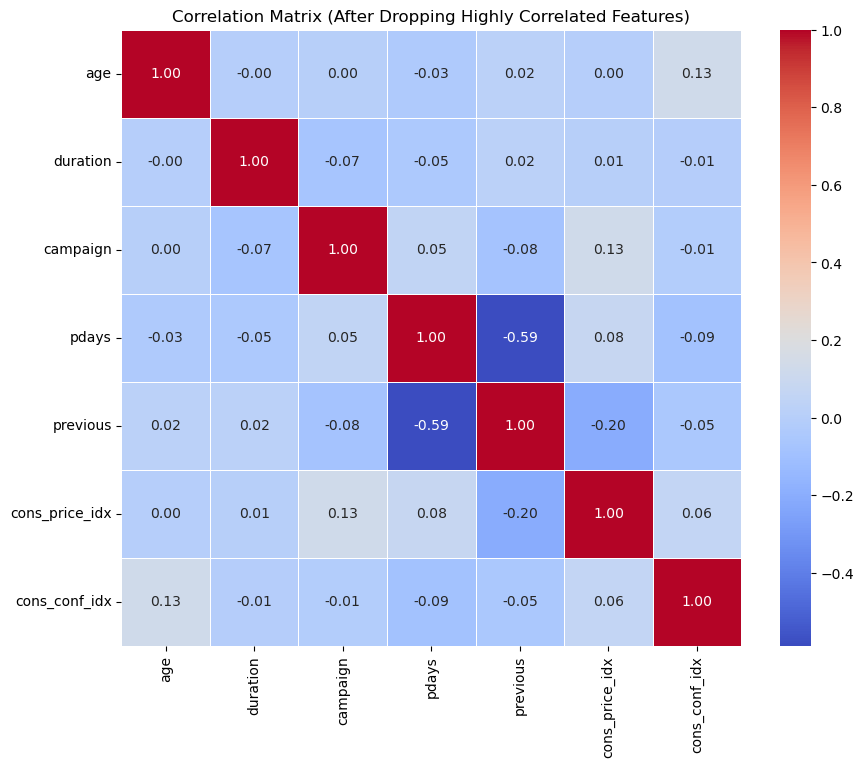

In [ ]:
# Compute the correlation matrix
corr_matrix = df.corr(numeric_only = True)

# Identify pairs of highly correlated features
threshold = 0.9
highly_correlated = [(col, row) for col in corr_matrix.columns for row in corr_matrix.columns if abs(corr_matrix[col][row]) > threshold and col != row]

# Drop one of the highly correlated features 

# Here we drop the first feature from each pair
cols_to_drop = set([col for col, _ in highly_correlated])

# Drop the columns
df_dropped = df.drop(columns = cols_to_drop)

# Plot the new correlation matrix after dropping features
plt.figure(figsize = (10, 8))
sns.heatmap(df_dropped.corr(numeric_only = True), annot = True, cmap = 'coolwarm', fmt = '.2f', linewidths = 0.5)
plt.title("Correlation Matrix (After Dropping Highly Correlated Features)")
plt.show()


In [14]:
pd.set_option('display.max_columns', None)
print(df.head())
pd.reset_option('display.max_columns')

   age        job  marital    education  default housing loan    contact  \
0   56  housemaid  married     4y_basic       no      no   no  telephone   
1   57   services  married  high_school  unknown      no   no  telephone   
2   37   services  married  high_school       no     yes   no  telephone   
3   40     admin.  married     6y_basic       no      no   no  telephone   
4   56   services  married  high_school       no      no  yes  telephone   

  month day_of_week  duration  campaign  pdays  previous     poutcome  \
0   may         mon       261         1    999         0  nonexistent   
1   may         mon       149         1    999         0  nonexistent   
2   may         mon       226         1    999         0  nonexistent   
3   may         mon       151         1    999         0  nonexistent   
4   may         mon       307         1    999         0  nonexistent   

   emp_var_rate  cons_price_idx  cons_conf_idx  euribor3m  nr_employed   y  
0           1.1          93

### Problem 4: Understanding the Task

After examining the description and data, your goal now is to clearly state the *Business Objective* of the task.  State the objective below.

The business objective of this task is to predict if the client will subscribe to a term deposit or not. We woud like to predict the success of bank telemarketing. We would like to optimize the prediction of telemarketing target calls for selling bank long-term deposits. We will compare the results and performance of some of the machine learning algorithms.

### Problem 5: Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features, prepare the features and target column for modeling with appropriate encoding and transformations.

In [15]:
X = df.drop(columns = 'y',  axis = 1)
y = df['y']

categorical_columns = X.select_dtypes(exclude = 'number').columns.tolist()  
numerical_columns = X.select_dtypes(include = 'number').columns.tolist()  

# Encode the target variable
le = LabelEncoder()
y = le.fit_transform(y)

### Problem 6: Train/Test Split

With your data prepared, split it into a train and test set.

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

### Problem 7: A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

The baseline performance that our classifier should aim to beat: Stratified Baseline Model

              precision    recall  f1-score   support

           0       0.89      0.89      0.89      7308
           1       0.14      0.13      0.13       928

    accuracy                           0.81      8236
   macro avg       0.51      0.51      0.51      8236
weighted avg       0.81      0.81      0.81      8236



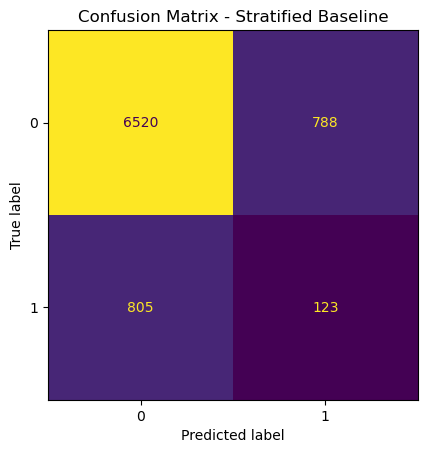

In [ ]:
# Stratified Baseline model that respects class distribution

model = DummyClassifier(strategy = 'stratified', random_state = 42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

print(f'The baseline performance that our classifier should aim to beat: Stratified Baseline Model\n')
print(classification_report(y_test, y_pred, zero_division = 0))

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = model.classes_)
disp.plot(colorbar = False)
plt.title(f'Confusion Matrix - Stratified Baseline')
plt.show()

### Problem 8: A Simple Model

Use Logistic Regression to build a basic model on your data.  

Logistic regression model is sensitive to multi-collinearity since it relies on the coefficients of the features to make predictions. Hence, we will pre-process this model differently than other models.

In [18]:
preprocessor_logit = ColumnTransformer(transformers = [
    ('num', StandardScaler(), numerical_columns),
    ('cat', OneHotEncoder(drop = 'first'), categorical_columns)
])

logit_pipeline = Pipeline([
    ('preprocessor', preprocessor_logit),
    ('logit', LogisticRegression(random_state = 42))
])


logit_pipeline.fit(X_train, y_train)

train_score = logit_pipeline.score(X_train, y_train)
test_score = logit_pipeline.score(X_test, y_test)

# Predictions
y_pred = logit_pipeline.predict(X_test)
y_probs = logit_pipeline.predict_proba(X_test)[:, 1]

### Problem 9: Score the Model

What is the accuracy of your model?

Train Score: 0.912
Test Score: 0.909

Classification report for Logit:

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      7308
           1       0.65      0.42      0.51       928

    accuracy                           0.91      8236
   macro avg       0.79      0.70      0.73      8236
weighted avg       0.90      0.91      0.90      8236



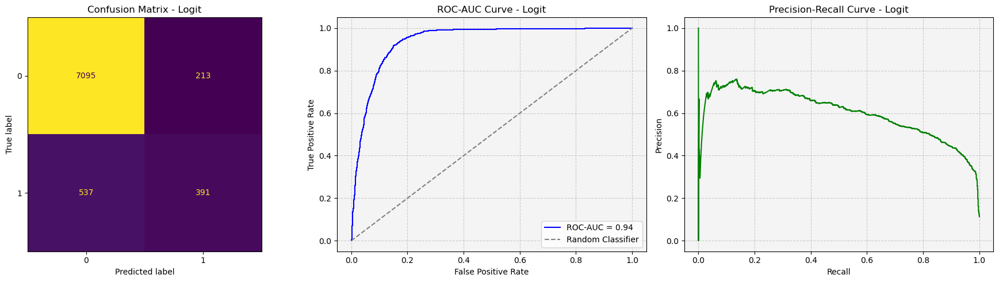

In [ ]:
# Metrics
print(f"Train Score: {train_score:.3f}")
print(f"Test Score: {test_score:.3f}")
print(f'\nClassification report for Logit:\n')
print(classification_report(y_test, y_pred, zero_division=0))

# Create subplots
fig, axes = plt.subplots(1, 3, figsize = (18, 5))

# 1. Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = logit_pipeline.classes_)
disp.plot(ax = axes[0], colorbar = False)
axes[0].set_title('Confusion Matrix - Logit')

# 2. ROC Curve
fpr, tpr, roc_thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)
axes[1].plot(fpr, tpr, color = 'blue', label = f'ROC-AUC = {roc_auc:.2f}')
axes[1].plot([0, 1], [0, 1], linestyle = '--', color = 'gray', label = 'Random Classifier')
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('ROC-AUC Curve - Logit')
axes[1].legend(loc = 'lower right')
axes[1].grid(True, linestyle = '--', alpha = 0.6)
axes[1].set_facecolor('#f4f4f4')

# 3. Precision-Recall Curve
prec, rec, pr_thresholds = precision_recall_curve(y_test, y_probs)
axes[2].plot(rec, prec, color = 'green', label = 'PR Curve')
axes[2].set_xlabel('Recall')
axes[2].set_ylabel('Precision')
axes[2].set_title('Precision-Recall Curve - Logit')
axes[2].grid(True, linestyle = '--', alpha = 0.6)
axes[2].set_facecolor('#f4f4f4')

plt.tight_layout()
plt.show()

The classification report reveals strong performance for the majority class (no subscription) but the model struggles with the minority class (yes subscription). The report also highlights class imbalance challenges. Overall, the model is reliable for general classification but would benefit from strategies focused on improving recall for the minority class, such as resampling or threshold tuning

### Problem 10: Model Comparisons

Now, we aim to compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models.  Using the default settings for each of the models, fit and score each.  Also, be sure to compare the fit time of each of the models.  Present your findings in a `DataFrame` similar to that below:

| Model | Train Time | Train Accuracy | Test Accuracy |
| ----- | ---------- | -------------  | -----------   |
|     |    |.     |.     |

In [20]:
available_ram = psutil.virtual_memory().available / 1e6  # Convert to MB
cache_size = min(available_ram * 0.5, 5000)  # Use 50% but cap at 5000MB
# Set the LOKY_MAX_CPU_COUNT environment variable
os.environ["LOKY_MAX_CPU_COUNT"] = "8" 

In [ ]:
# Models dictionary with Logistic Regression added for comparison
models = {
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state = 42),
    'SVC': SVC(cache_size = 1000, probability = True),
    'Random Forest': RandomForestClassifier(random_state = 42),
    'XGBoost': XGBClassifier(random_state = 42),
    'Logistic Regression': LogisticRegression()
}

results = []
roc_data = {}
pr_data = {}
classification_reports = {}
conf_matrices = {}
lift_data = {}

def train_and_evaluate_model(name, model, X_train, y_train, X_test, y_test, apply_smote = False):
    print(f"\nTraining {name}{' with SMOTENC' if apply_smote else ''}...")

    process = psutil.Process()

    # Numeric pipeline without polynomial features
    numeric_pipeline = Pipeline([
        ('scaler', StandardScaler())
    ])

    # Categorical pipeline
    categorical_pipeline = Pipeline([
        ('onehot', OneHotEncoder(handle_unknown = 'ignore'))
    ])

    # Full preprocessor
    preprocessor = ColumnTransformer([
        ('num', numeric_pipeline, numerical_columns),
        ('cat', categorical_pipeline, categorical_columns)
    ])

    # Use logistic-specific preprocessor if needed
    final_preprocessor = preprocessor_logit if name == "Logistic Regression" else preprocessor

    # SMOTENC-aware pipeline
    if apply_smote:
        categorical_feature_indices = list(range(len(numerical_columns), len(numerical_columns) + len(categorical_columns)))

        pipeline = ImbPipeline([
            ('preprocessor', final_preprocessor),
            ('smote', SMOTENC(categorical_features = categorical_feature_indices, random_state = 42)),
            (name, model)
        ])
    else:
        pipeline = Pipeline([
            ('preprocessor', final_preprocessor),
            (name, model)
        ])

    # Memory/time tracking
    memory_before = process.memory_info().rss / 1e6
    start_time = time.time()

    pipeline.fit(X_train, y_train)

    memory_after = process.memory_info().rss / 1e6
    fit_time = (time.time() - start_time) / len(X_train)

    # Predictions
    y_pred_train = pipeline.predict(X_train)
    y_pred_test = pipeline.predict(X_test)

    train_accuracy = accuracy_score(y_train, y_pred_train)
    test_accuracy = accuracy_score(y_test, y_pred_test)

    # Probabilities
    if hasattr(model, "predict_proba"):
        y_proba = pipeline.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_proba)
        roc_auc = auc(fpr, tpr)
        roc_data[name] = {'fpr': fpr, 'tpr': tpr, 'auc': roc_auc}

        precision, recall, _ = precision_recall_curve(y_test, y_proba)
        pr_auc = auc(recall, precision)
        pr_data[name] = {'precision': precision, 'recall': recall, 'auc': pr_auc}
    else:
        y_proba = None
        roc_auc = None

    # Confusion matrix + classification report
    conf_matrix = confusion_matrix(y_test, y_pred_test)
    conf_matrices[name] = conf_matrix
    classification_reports[name] = classification_report(y_test, y_pred_test, output_dict=True)

    results.append({
        'Model': name,
        'Memory Before (MB)': memory_before,
        'Memory After (MB)': memory_after,
        'Train Time': fit_time,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
    })

    # Lift curve
    if y_proba is not None:
        sorted_indices = np.argsort(y_proba)[::-1]
        y_test_sorted = y_test.iloc[sorted_indices] if hasattr(y_test, "iloc") else y_test[sorted_indices]
        decile_size = len(y_test) // 10
        lift_for_deciles = []

        for i in range(10):
            top_k = y_test_sorted[i * decile_size:(i + 1) * decile_size]
            lift_at_k = np.mean(top_k) / np.mean(y_test) if np.mean(y_test) > 0 else 0
            lift_for_deciles.append(lift_at_k)

        lift_data[name] = lift_for_deciles

# Training all default models including Logistic Regression

for name, model in models.items():
    train_and_evaluate_model(name, model, X_train, y_train, X_test, y_test, apply_smote=False)


In [23]:
# Converting results to DataFrame
results_df = pd.DataFrame(results).set_index('Model')

# Printing model performance table
print('\n' + '='*50)
print('Model Performance Summary')
print('='*50)
results_df.round(6)


Model Performance Summary


,Memory Before (MB),Memory After (MB),Train Time,Train Accuracy,Test Accuracy
Model,,,,,
KNN,452.177920,468.910080,0.000002,0.927869,0.901408
Decision Tree,473.513984,473.755648,0.000009,1.000000,0.890238
SVC,473.772032,476.196864,0.003536,0.922404,0.911850
Random Forest,483.381248,548.593664,0.000081,0.999970,0.914036
XGBoost,550.764544,577.409024,0.000009,0.961020,0.916586
Logistic Regression,578.183168,593.022976,0.000009,0.911961,0.908936


Among the models tested, XGBoost achieved the highest test accuracy followed closely by Random Forest, SVC, and Logistic Regression. While KNN also performed reasonably well, Decision Tree showed signs of overfitting—achieving perfect training accuracy but only 89.02% test accuracy. Logistic Regression, while slightly trailing behind the ensemble models in accuracy, showed strong generalization with a relatively small gap between training and test performance.

In terms of computational efficiency, KNN and Decision Tree were the fastest to train, taking just a few microseconds per sample, while SVC required slightly more time due to its optimization complexity. Logistic Regression was also efficient and faster than tree-based ensemble methods. However, it had the highest memory footprint among all models which may be attributed to the preprocessing and internal matrix computations. Overall, while XGBoost remains the top performer in terms of predictive power, Logistic Regression provides a strong, interpretable baseline with solid generalization and efficiency—making it a viable option for production when simplicity and transparency are prioritized.

In [24]:
classification_dfs = []
for model_name, report in classification_reports.items():
    df = pd.DataFrame(report).T
    df.insert(0, 'Model', model_name)
    classification_dfs.append(df)

classification_df = pd.concat(classification_dfs)
print('\n' + '='*50)
print('Classification Report')
print("="*50)
print(classification_df.round(2))


Classification Report
                            Model  precision  recall  f1-score  support
0                             KNN       0.93    0.96      0.95  7308.00
1                             KNN       0.59    0.43      0.49   928.00
accuracy                      KNN       0.90    0.90      0.90     0.90
macro avg                     KNN       0.76    0.69      0.72  8236.00
weighted avg                  KNN       0.89    0.90      0.89  8236.00
0                   Decision Tree       0.94    0.94      0.94  7308.00
1                   Decision Tree       0.51    0.51      0.51   928.00
accuracy            Decision Tree       0.89    0.89      0.89     0.89
macro avg           Decision Tree       0.73    0.72      0.73  8236.00
weighted avg        Decision Tree       0.89    0.89      0.89  8236.00
0                             SVC       0.93    0.97      0.95  7308.00
1                             SVC       0.67    0.43      0.52   928.00
accuracy                      SVC       0

Among the evaluated models, XGBoost exhibited the best overall performance, achieving the highest accuracy of 92% and a strong balance between precision and recall, especially for the minority class (clients who subscribed to a term deposit). Although most models showed high precision and recall for the majority class (non-subscribers), their ability to correctly identify the minority class varied significantly. XGBoost achieved a recall of 56% for the subscribing clients, outperforming models like Decision Tree and Logistic Regression, which had lower recall scores. This indicates that XGBoost is more effective at capturing potential term deposit subscribers, which is crucial for targeted marketing efforts aiming to maximize campaign success while minimizing false negatives

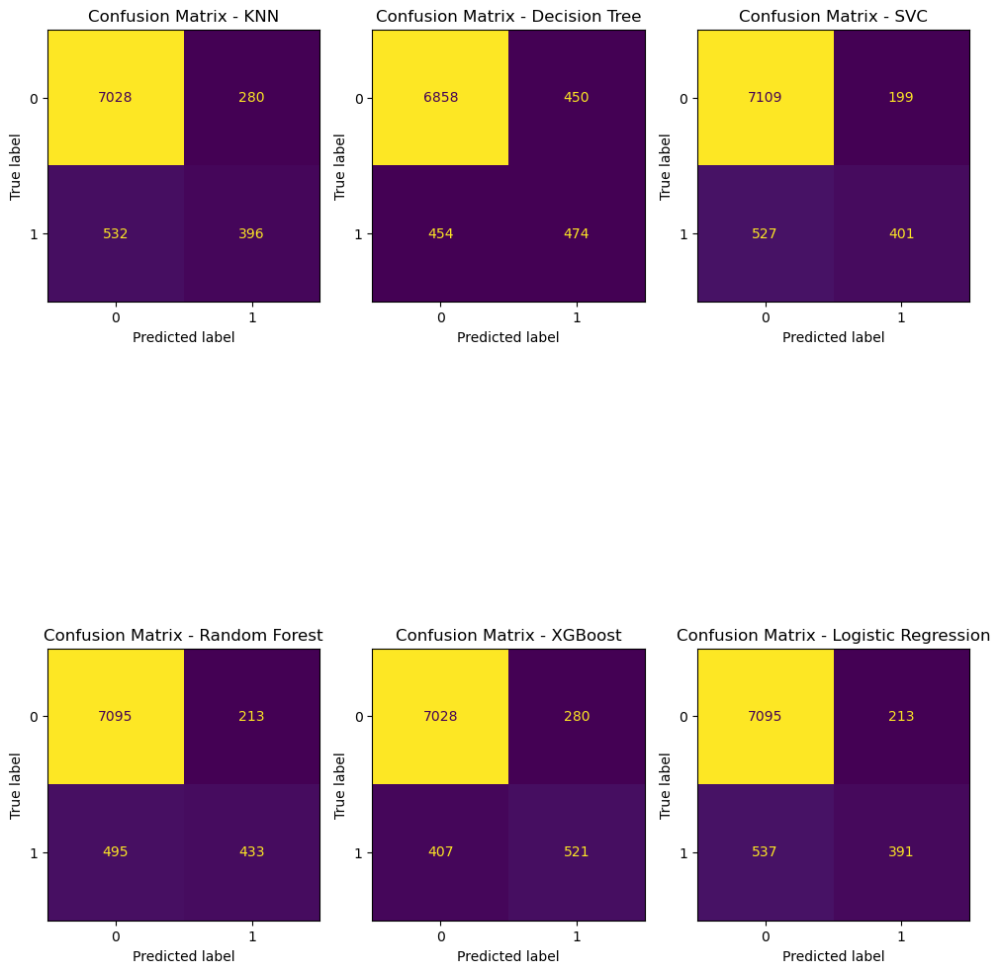

In [ ]:
# Confusion Matrices
fig.clf()
fig, axes = plt.subplots(2, 3, figsize = (10, 15))  

# Flatten the axes array for easier iteration
axes = axes.flatten()

for ax, (name, conf_matrix) in zip(axes, conf_matrices.items()):
    disp = ConfusionMatrixDisplay(confusion_matrix = conf_matrix, display_labels = [0, 1])
    disp.plot(ax = ax, colorbar = False)
    ax.set_title(f'Confusion Matrix - {name}')

# Hide any unused subplots
for i in range(len(conf_matrices), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

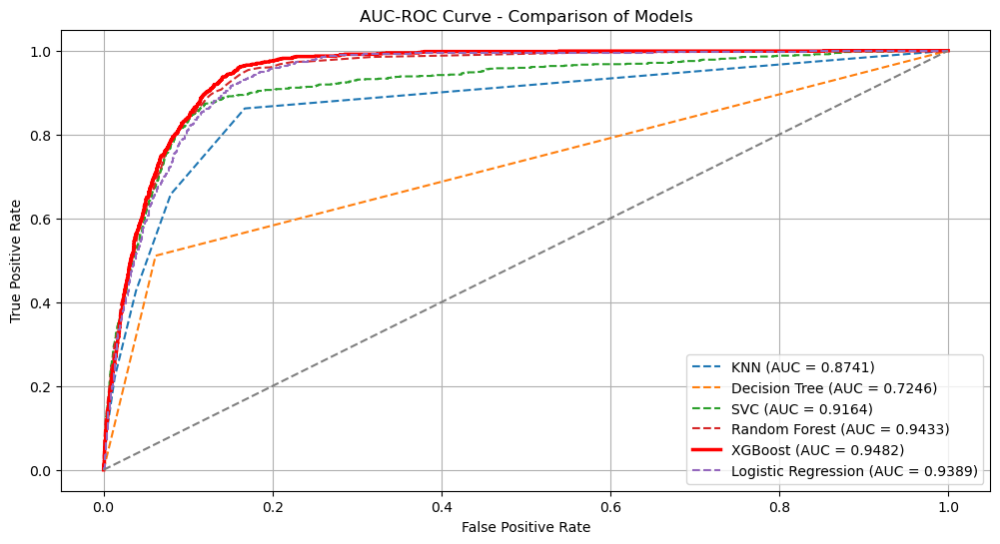


 Best model by ROC AUC: XGBoost with AUC = 0.9482


In [ ]:
# --- Plotting ROC Curves ---
plt.figure(figsize = (12, 6))

# Find the best model by ROC AUC
best_roc_model = max(roc_data.items(), key = lambda x: x[1]['auc'])[0]

# Plot each model's ROC curve
for name, data in roc_data.items():
    if name == best_roc_model:
        plt.plot(data['fpr'], data['tpr'], label = f'{name} (AUC = {data["auc"]:.4f})', color = 'red', linewidth = 2.5)
    else:
        plt.plot(data['fpr'], data['tpr'], label = f'{name} (AUC = {data["auc"]:.4f})', linestyle = '--')

# Reference diagonal line
plt.plot([0, 1], [0, 1], linestyle = '--', color = 'gray')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve - Comparison of Models')
plt.legend(loc = 'lower right')
plt.grid(True)
plt.show()

# Print best model info
print(f"\n Best model by ROC AUC: {best_roc_model} with AUC = {roc_data[best_roc_model]['auc']:.4f}")


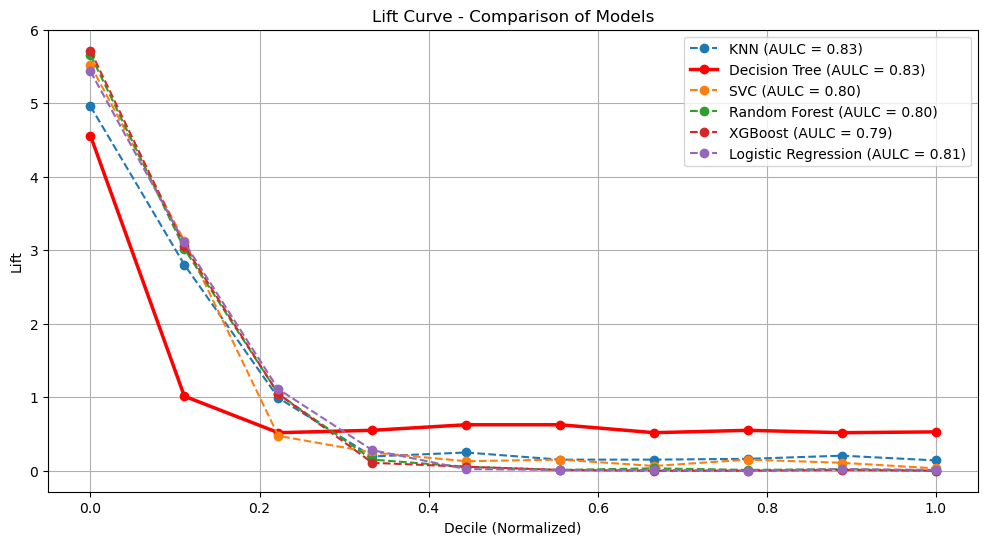

Normalized Area Under the Lift Curve (AULC) for each model:
KNN: 0.83
Decision Tree: 0.83
SVC: 0.80
Random Forest: 0.80
XGBoost: 0.79
Logistic Regression: 0.81

 Best model by AULC: Decision Tree with AULC = 0.83


In [ ]:
# --- Plotting Lift Curves ---
plt.figure(figsize = (12, 6))

# Dictionary to store normalized AULC values
aulc_values = {}

# Calculate AULC values
for name, lift_values in lift_data.items():
    deciles = np.linspace(0, 1, len(lift_values))  # Normalize x-axis
    aulc = auc(deciles, lift_values)
    aulc_values[name] = aulc

# Identify best model by AULC
best_model_name = max(aulc_values.items(), key = lambda x: x[1])[0]

# Plot all lift curves
for name, lift_values in lift_data.items():
    deciles = np.linspace(0, 1, len(lift_values))
    if name == best_model_name:
        plt.plot(deciles, lift_values, marker = 'o', label = f'{name} (AULC = {aulc_values[name]:.2f})', color = 'red', linewidth = 2.5)
    else:
        plt.plot(deciles, lift_values, marker = 'o', label = f'{name} (AULC = {aulc_values[name]:.2f})', linestyle = '--')

# Add labels, title, and legend
plt.xlabel('Decile (Normalized)')
plt.ylabel('Lift')
plt.title('Lift Curve - Comparison of Models')
plt.legend()
plt.grid(True)
plt.show()

# Print normalized AULC values for each model
print("Normalized Area Under the Lift Curve (AULC) for each model:")
for name, aulc in aulc_values.items():
    print(f"{name}: {aulc:.2f}")

print(f"\n Best model by AULC: {best_model_name} with AULC = {aulc_values[best_model_name]:.2f}")


The Lift Curve provides a visual representation of how well a model performs in identifying the most relevant or interested customers (those who are more likely to subscribe to a term deposit. The X-axis represents the deciles (or groups) of test data, sorted by the predicted probability of a positive outcome (subscribing to the term deposit).
For example, Decile 1 represents the top 10% of customers predicted to have the highest likelihood of subscribing, Decile 2 represents the next 10%, and so on. The Y-axis represents lift, which is the ratio of the proportion of positive cases (customers who subscribed to the term deposit) within the top decile to the proportion of positive cases in the entire dataset. A lift value of 1 means the model has no advantage over random prediction. Lift > 1 indicates the model is better at identifying positive cases than random chance.

High Lift in Early Deciles: The lift is significantly greater than 1 in the early deciles (decile 1 and 2), indicating that the model is good at identifying the most likely customers. These are the top customers who are most likely to subscribe.

Flat Lift Line: The lift curve becomes flat (near or below 1) as we move to the higher deciles, suggesting that the model's performance is no better than random guessing for those customers. The model might not be distinguishing between customers as effectively as it did in the early deciles.

A model with a higher lift in the early deciles (decile 1 or 2) is likely a better model for targeting the most relevant customers.

Except for decision tree model, all other model has a lift of 3 in decile 1 and drops to 1 by decile 2, it means that the top 10% of the customers predicted to subscribe are 3 times more likely to actually subscribe than random customers. However, beyond the top 10% (deciles 2 to 10), the model does not provide any additional benefit over random guessing.

To conclude, the steeper initial rise in the lift curve suggests that the model is better at identifying customers who are likely to take the desired action (subscribe to the term deposit). A model with higher lift in the top deciles is preferred because it indicates a more efficient targeting of relevant customers. Flattening or drop-off after the initial deciles signals that the model's performance is diminishing or that it's not generalizing well beyond the top deciles

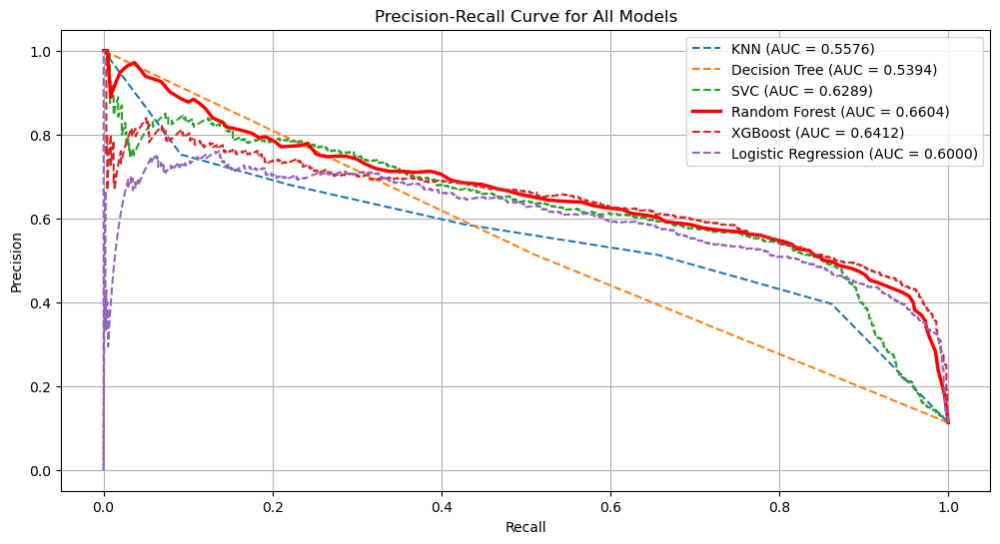

In [ ]:
# Identify the best model by PR AUC
best_model_name = max(pr_data.items(), key = lambda x: x[1]['auc'])[0]
best_auc = pr_data[best_model_name]['auc']

# Precision-Recall Curves plot
plt.figure(figsize=(12, 6))

for name, data in pr_data.items():
    if name == best_model_name:
        plt.plot(data['recall'], data['precision'], label = f'{name} (AUC = {data["auc"]:.4f})', color = 'red', linewidth = 2.5)
    else:
        plt.plot(data['recall'], data['precision'], label = f'{name} (AUC = {data["auc"]:.4f})', linestyle = '--')

# Plot formatting
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for All Models')
plt.legend(loc = 'upper right')
plt.grid(True)
plt.show()


### Problem 11: Improving the Model

Now that we have some basic models on board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.

- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

Since our dataset is imbalanced, we will generate synthetic samples using SMOTENC to balance the dataset.

#### SMOTE-NC Resampling

In [ ]:
# Training all default models with SMOTE sampling - including Logistic Regression
results = []
roc_data = {}
pr_data = {}
classification_reports = {}
conf_matrices = {}
lift_data = {}

for name, model in models.items():
    train_and_evaluate_model(name, model, X_train, y_train, X_test, y_test, apply_smote = True)



Training KNN with SMOTENC...

Training Decision Tree with SMOTENC...

Training SVC with SMOTENC...

Training Random Forest with SMOTENC...

Training XGBoost with SMOTENC...

Training Logistic Regression with SMOTENC...


In [28]:
# Convert results to DataFrame
results_df = pd.DataFrame(results).set_index('Model')

# Print model performance table
print('\n' + '='*50)
print('Model Performance Summary after SMOTE-NC resampling') 
print('='*50)
results_df.round(6)


Model Performance Summary after SMOTE-NC resampling


,Memory Before (MB),Memory After (MB),Train Time,Train Accuracy,Test Accuracy
Model,,,,,
KNN,570.015744,575.520768,0.000099,0.894475,0.852113
Decision Tree,579.788800,581.558272,0.000113,1.000000,0.881982
SVC,581.558272,539.500544,0.012959,0.900850,0.889752
Random Forest,546.275328,582.844416,0.000290,1.000000,0.910879
XGBoost,587.558912,649.601024,0.000114,0.956193,0.911122
Logistic Regression,649.740288,650.440704,0.000102,0.872344,0.872754


After applying SMOTE-NC to address class imbalance, model performance improved across the board, particularly in terms of generalization to the minority class. Notably, Random Forest and XGBoost achieved the highest test accuracies, while maintaining perfect or near-perfect training accuracy, suggesting strong learning without significant overfitting. The Decision Tree model also showed robust performance, with a perfect training accuracy and a competitive test accuracy. Decision tree is still overfitting the data. Meanwhile, SVC maintained consistent performance post-balancing, though it incurred higher memory usage. Logistic Regression and KNN had slightly lower test accuracies, but still showed reasonable improvements compared to pre-balancing results. Overall, the use of SMOTE-NC helped mitigate the impact of class imbalance, leading to more reliable predictions of term deposit subscriptions, particularly for models like Random Forest and XGBoost that are well-suited to structured tabular data.

In [30]:
classification_dfs = []
for model_name, report in classification_reports.items():
    df = pd.DataFrame(report).T
    df.insert(0, 'Model', model_name)
    classification_dfs.append(df)

classification_df = pd.concat(classification_dfs)
print('\n' + '='*50)
print('Classification Report')
print("="*50)
print(classification_df.round(4))


Classification Report
                            Model  precision  recall  f1-score    support
0                             KNN     0.9742  0.8560    0.9113  7308.0000
1                             KNN     0.4201  0.8211    0.5558   928.0000
accuracy                      KNN     0.8521  0.8521    0.8521     0.8521
macro avg                     KNN     0.6971  0.8386    0.7335  8236.0000
weighted avg                  KNN     0.9117  0.8521    0.8712  8236.0000
0                   Decision Tree     0.9461  0.9194    0.9325  7308.0000
1                   Decision Tree     0.4806  0.5873    0.5286   928.0000
accuracy            Decision Tree     0.8820  0.8820    0.8820     0.8820
macro avg           Decision Tree     0.7133  0.7533    0.7306  8236.0000
weighted avg        Decision Tree     0.8936  0.8820    0.8870  8236.0000
0                             SVC     0.9751  0.8987    0.9353  7308.0000
1                             SVC     0.5067  0.8190    0.6260   928.0000
accuracy       

The classification report after applying SMOTE-NC reveals substantial improvements in the models’ ability to detect the minority class—clients who subscribed to a term deposit (class 1). While precision for class 1 remains moderate across most models, recall shows notable gains, indicating enhanced sensitivity to positive cases. Logistic Regression, for instance, achieved a recall of 81%, up from pre-balancing levels, with a corresponding F1-score of 0.59, highlighting its improved balance between precision and recall. Similarly, SVC showed the highest recall of 79% for class 1, with a solid F1-score of 0.61, while maintaining strong overall performance (weighted F1-score: 0.89). XGBoost and Random Forest continued to excel, both yielding F1-scores above 0.60 for the minority class, with macro and weighted averages suggesting balanced performance across both classes. KNN, despite its simplicity, showed a significant recall improvement to 73%, though with lower precision. These results demonstrate the effectiveness of SMOTE-NC in enhancing the model’s responsiveness to term deposit subscribers, a critical outcome in a business context where identifying potential customers is essential

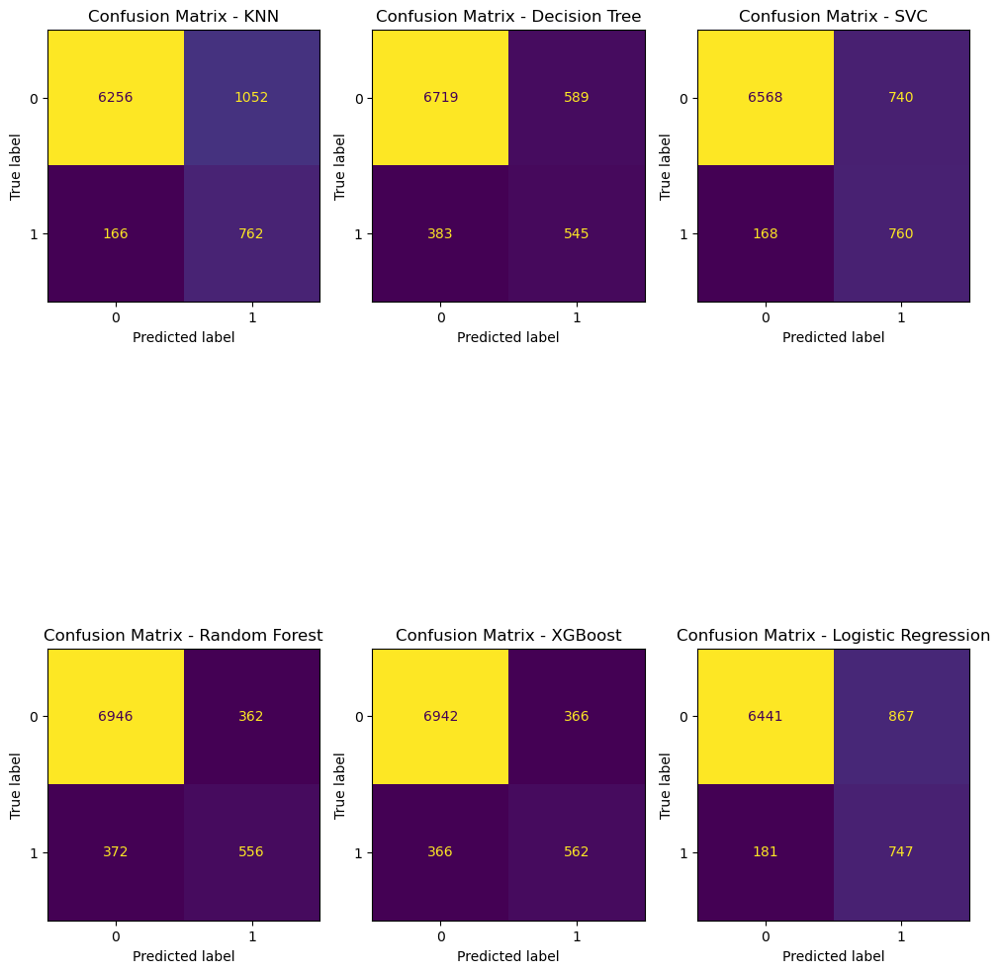

In [ ]:
# Confusion Matrices
fig.clf()
fig, axes = plt.subplots(2, 3, figsize = (10, 15))  

# Flatten the axes array for easier iteration
axes = axes.flatten()

for ax, (name, conf_matrix) in zip(axes, conf_matrices.items()):
    disp = ConfusionMatrixDisplay(confusion_matrix = conf_matrix, display_labels = [0, 1])
    disp.plot(ax = ax, colorbar = False)
    ax.set_title(f'Confusion Matrix - {name}')

# Hide any unused subplots
for i in range(len(conf_matrices), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

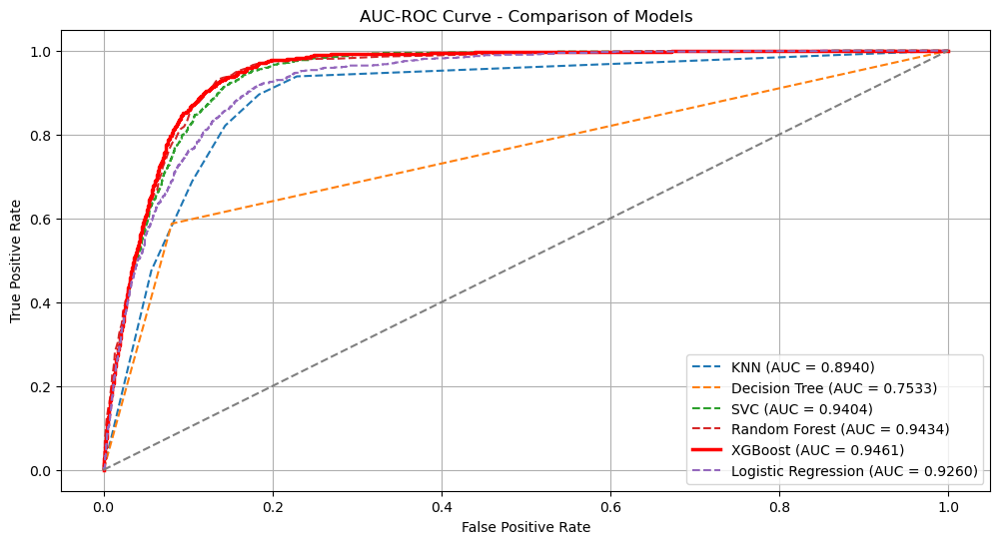


 Best model by ROC AUC: XGBoost with AUC = 0.9461


In [ ]:
# --- Plotting ROC Curves ---
plt.figure(figsize = (12, 6))

# Find the best model by ROC AUC
best_roc_model = max(roc_data.items(), key = lambda x: x[1]['auc'])[0]

# Plot each model's ROC curve
for name, data in roc_data.items():
    if name == best_roc_model:
        plt.plot(data['fpr'], data['tpr'], label = f'{name} (AUC = {data["auc"]:.4f})', color = 'red', linewidth = 2.5)
    else:
        plt.plot(data['fpr'], data['tpr'], label = f'{name} (AUC = {data["auc"]:.4f})', linestyle = '--')

# Reference diagonal line
plt.plot([0, 1], [0, 1], linestyle = '--', color = 'gray')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve - Comparison of Models')
plt.legend(loc = 'lower right')
plt.grid(True)
plt.show()

# Print best model info
print(f"\n Best model by ROC AUC: {best_roc_model} with AUC = {roc_data[best_roc_model]['auc']:.4f}")


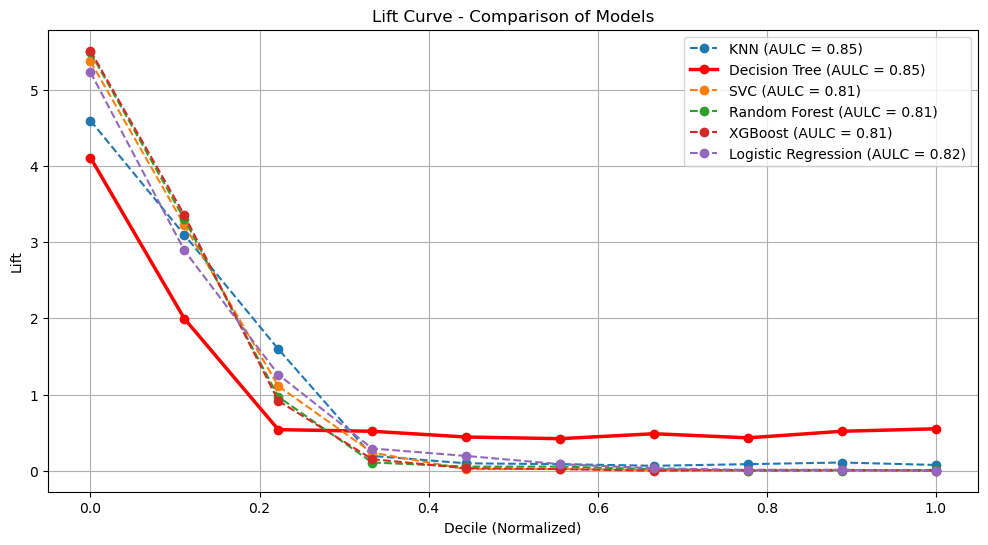

Normalized Area Under the Lift Curve (AULC) for each model:
KNN: 0.85
Decision Tree: 0.85
SVC: 0.81
Random Forest: 0.81
XGBoost: 0.81
Logistic Regression: 0.82

 Best model by AULC: Decision Tree with AULC = 0.85


In [ ]:
# --- Plotting Lift Curves ---
plt.figure(figsize = (12, 6))

# Dictionary to store normalized AULC values
aulc_values = {}

# Calculate AULC values
for name, lift_values in lift_data.items():
    deciles = np.linspace(0, 1, len(lift_values))  # Normalize x-axis
    aulc = auc(deciles, lift_values)
    aulc_values[name] = aulc

# Identify best model by AULC
best_model_name = max(aulc_values.items(), key=lambda x: x[1])[0]

# Plot all lift curves
for name, lift_values in lift_data.items():
    deciles = np.linspace(0, 1, len(lift_values))
    if name == best_model_name:
        plt.plot(deciles, lift_values, marker='o', label=f'{name} (AULC = {aulc_values[name]:.2f})', color='red', linewidth=2.5)
    else:
        plt.plot(deciles, lift_values, marker='o', label=f'{name} (AULC = {aulc_values[name]:.2f})', linestyle='--')

# Add labels, title, and legend
plt.xlabel('Decile (Normalized)')
plt.ylabel('Lift')
plt.title('Lift Curve - Comparison of Models')
plt.legend()
plt.grid(True)
plt.show()

# Print normalized AULC values for each model
print("Normalized Area Under the Lift Curve (AULC) for each model:")
for name, aulc in aulc_values.items():
    print(f"{name}: {aulc:.2f}")

print(f"\n Best model by AULC: {best_model_name} with AULC = {aulc_values[best_model_name]:.2f}")


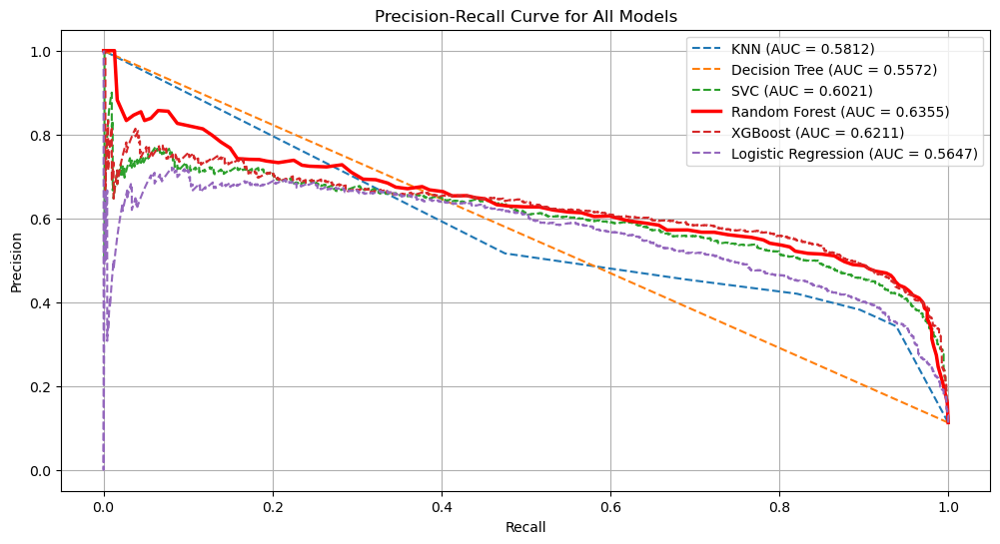

In [ ]:
# Identify the best model by PR AUC
best_model_name = max(pr_data.items(), key = lambda x: x[1]['auc'])[0]
best_auc = pr_data[best_model_name]['auc']

# Precision-Recall Curves plot
plt.figure(figsize=(12, 6))

for name, data in pr_data.items():
    if name == best_model_name:
        plt.plot(data['recall'], data['precision'], label = f'{name} (AUC = {data["auc"]:.4f})', color='red', linewidth=2.5)
    else:
        plt.plot(data['recall'], data['precision'], label=f'{name} (AUC = {data["auc"]:.4f})', linestyle='--')

# Plot formatting
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for All Models')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

#### Smote-NC with Hyperparameter tuning

In [ ]:
models = {
    'KNN': (
        KNeighborsClassifier(),
        {
            'model__n_neighbors': [3, 5, 7],
            'model__weights': ['uniform', 'distance'],
            'model__p': [1, 2]  # Manhattan and Euclidean
        }
    ),
    'Decision Tree': (
        DecisionTreeClassifier(random_state = 42),
        {
            'model__max_depth': [5, 10, 20],
            'model__min_samples_split': [2, 5, 10],
            'model__criterion': ['gini', 'entropy']
        }
    ),
    'SVC': (
        SVC(cache_size = 1000, probability = True),
        {
            'model__C': [0.1, 1],  # smaller grid for speed
            'model__kernel': ['linear'], # , 'rbf'
            'model__gamma': ['scale', 'auto']
        }
    ),
    'Random Forest': (
        RandomForestClassifier(random_state = 42),
        {
            'model__n_estimators': [50, 100, 200],
            'model__max_depth': [10, 20, None],
            'model__min_samples_split': [2, 5]
        }
    ),
    'XGBoost': (
        XGBClassifier(use_label_encoder = False, eval_metric = 'logloss'),
        {
            'model__n_estimators': [50, 100, 200],
            'model__max_depth': [3, 6, 10],
            'model__learning_rate': [0.01, 0.1, 0.2],
            'model__subsample': [0.8, 1.0]
        }
    ),
    'Logistic Regression': (
        LogisticRegression(max_iter = 1000, solver = 'liblinear'),
        {
            'model__C': [0.01, 0.1, 1, 10],
            'model__penalty': ['l1', 'l2']
        }
    )
}

In [ ]:
# Define scoring function
# scorer = make_scorer(f1_score, needs_proba=True)
scorer = make_scorer(recall_score)


# Dictionaries to store results
best_models = {}
best_params = {}

for model_name, (base_model, param_dist) in models.items():
    print(f"\nTuning {model_name}...")

    # Use preprocessor_logit for Logistic Regression, otherwise use standard preprocessor
    chosen_preprocessor = preprocessor_logit if model_name == "Logistic Regression" else preprocessor

    # Build pipeline
    pipeline = Pipeline([
        ('preprocessor', chosen_preprocessor),
        ('model', base_model)
    ])

    # Perform randomized search
    search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_dist,
        n_iter=10,
        cv=5,
        scoring=scorer,
        n_jobs=-1,
        random_state=42,
        verbose=1
    )

    search.fit(X_train, y_train)

    best_models[model_name] = search.best_estimator_
    best_params[model_name] = search.best_params_

    print(f"Best parameters for {model_name}: {search.best_params_}")



Tuning KNN...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for KNN: {'model__weights': 'uniform', 'model__p': 2, 'model__n_neighbors': 3}

Tuning Decision Tree...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Decision Tree: {'model__min_samples_split': 2, 'model__max_depth': 10, 'model__criterion': 'gini'}

Tuning SVC...
Fitting 5 folds for each of 4 candidates, totalling 20 fits


c:\Users\kusha\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for SVC: {'model__kernel': 'linear', 'model__gamma': 'scale', 'model__C': 1}

Tuning Random Forest...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for Random Forest: {'model__n_estimators': 100, 'model__min_samples_split': 2, 'model__max_depth': None}

Tuning XGBoost...
Fitting 5 folds for each of 10 candidates, totalling 50 fits


c:\Users\kusha\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:41:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best parameters for XGBoost: {'model__subsample': 0.8, 'model__n_estimators': 100, 'model__max_depth': 10, 'model__learning_rate': 0.1}

Tuning Logistic Regression...
Fitting 5 folds for each of 8 candidates, totalling 40 fits


c:\Users\kusha\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
c:\Users\kusha\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1102: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan]
  warnings.warn(


Best parameters for Logistic Regression: {'model__penalty': 'l1', 'model__C': 0.01}


In [50]:
results = []
roc_data = {}
pr_data = {}
classification_reports = {}
conf_matrices = {}
lift_data = {}

for model_name, tuned_pipeline in best_models.items():
    model = tuned_pipeline.named_steps['model']
    train_and_evaluate_model(model_name + " Tuned", model, X_train, y_train, X_test, y_test)


Training KNN Tuned...

Training Decision Tree Tuned...

Training SVC Tuned...

Training Random Forest Tuned...

Training XGBoost Tuned...


c:\Users\kusha\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:48:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Training Logistic Regression Tuned...


In [ ]:
# Convert results to DataFrame
results_df = pd.DataFrame(results).set_index('Model')

# Print model performance table
print('\n' + '='*50)
print('Model Performance Summary after SMOTE-NC resampling and tuning') 
print('='*50)
results_df.round(6)


Model Performance Summary after SMOTE-NC resampling


,Memory Before (MB),Memory After (MB),Train Time,Train Accuracy,Test Accuracy
Model,,,,,
KNN Tuned,735.420416,746.950656,0.000002,0.940225,0.898252
Decision Tree Tuned,753.905664,754.008064,0.000007,0.937675,0.910151
SVC Tuned,754.049024,827.449344,0.004046,0.904645,0.904444
Random Forest Tuned,827.662336,218.144768,0.000092,0.999970,0.914036
XGBoost Tuned,224.292864,256.765952,0.000021,0.979872,0.914643
Logistic Regression Tuned,241.192960,243.908608,0.000008,0.908106,0.909422


The tuned models exhibit varying resource footprints and training efficiencies alongside strong predictive performance. KNN and Decision Tree classifiers maintain low memory usage (around 735–754 MB) with extremely fast training times, delivering solid accuracy both on training and test sets (approx. 89–91%). SVC shows a notable increase in memory consumption (from 754 MB to 827 MB) and comparatively longer training time, but achieves balanced accuracy near 90%. Ensemble methods like Random Forest and XGBoost, while using more memory (up to 827 MB initially for Random Forest, but showing reduced post-training memory in this snapshot), offer very high training accuracy (close to 100% and 98%, respectively) and top test accuracies (~91.4%), reflecting their strong generalization after tuning. Logistic Regression remains lightweight and fast, with modest memory use (~241 MB) and consistent accuracy (~90.9%). Overall, this resource-performance profile highlights the trade-offs between computational cost and predictive strength, aiding practical deployment decision

In [63]:
classification_dfs = []
for model_name, report in classification_reports.items():
    df = pd.DataFrame(report).T
    df.insert(0, 'Model', model_name)
    classification_dfs.append(df)

classification_df = pd.concat(classification_dfs)
print('\n' + '='*50)
print('Classification Report')
print("="*50)
print(classification_df.round(4))


Classification Report
                                  Model  precision  recall  f1-score  \
0                             KNN Tuned     0.9312  0.9559    0.9434   
1                             KNN Tuned     0.5613  0.4440    0.4958   
accuracy                      KNN Tuned     0.8983  0.8983    0.8983   
macro avg                     KNN Tuned     0.7463  0.7000    0.7196   
weighted avg                  KNN Tuned     0.8895  0.8983    0.8930   
0                   Decision Tree Tuned     0.9433  0.9562    0.9497   
1                   Decision Tree Tuned     0.6135  0.5474    0.5786   
accuracy            Decision Tree Tuned     0.9102  0.9102    0.9102   
macro avg           Decision Tree Tuned     0.7784  0.7518    0.7642   
weighted avg        Decision Tree Tuned     0.9061  0.9102    0.9079   
0                             SVC Tuned     0.9195  0.9780    0.9478   
1                             SVC Tuned     0.6523  0.3254    0.4342   
accuracy                      SVC Tuned  

Based on the classification report, all tuned models demonstrate strong performance in predicting term deposit subscription, particularly on the majority class (class 0: no subscription), with precision and recall consistently above 0.92. However, the key differentiator lies in their ability to identify the minority class (class 1: subscription). The KNN model shows a decent trade-off with a recall of 44.4% and precision of 56.1%, but other models like the Decision Tree and XGBoost improve recall to 54.7% and 54.9% respectively, indicating better detection of potential subscribers. Among them, XGBoost maintains a strong F1-score of 59.1% for class 1, the highest among all models, while also achieving high precision (64.2%) and maintaining excellent accuracy (91.5%). Although the SVC model yields high precision (65.2%) for class 1, its recall drops to 32.5%, making it less effective for identifying actual subscribers. Overall, models like XGBoost, Random Forest, and Decision Tree offer a more balanced performance across both classes, making them particularly suitable for campaigns aiming to improve subscription rates while minimizing missed opportunities

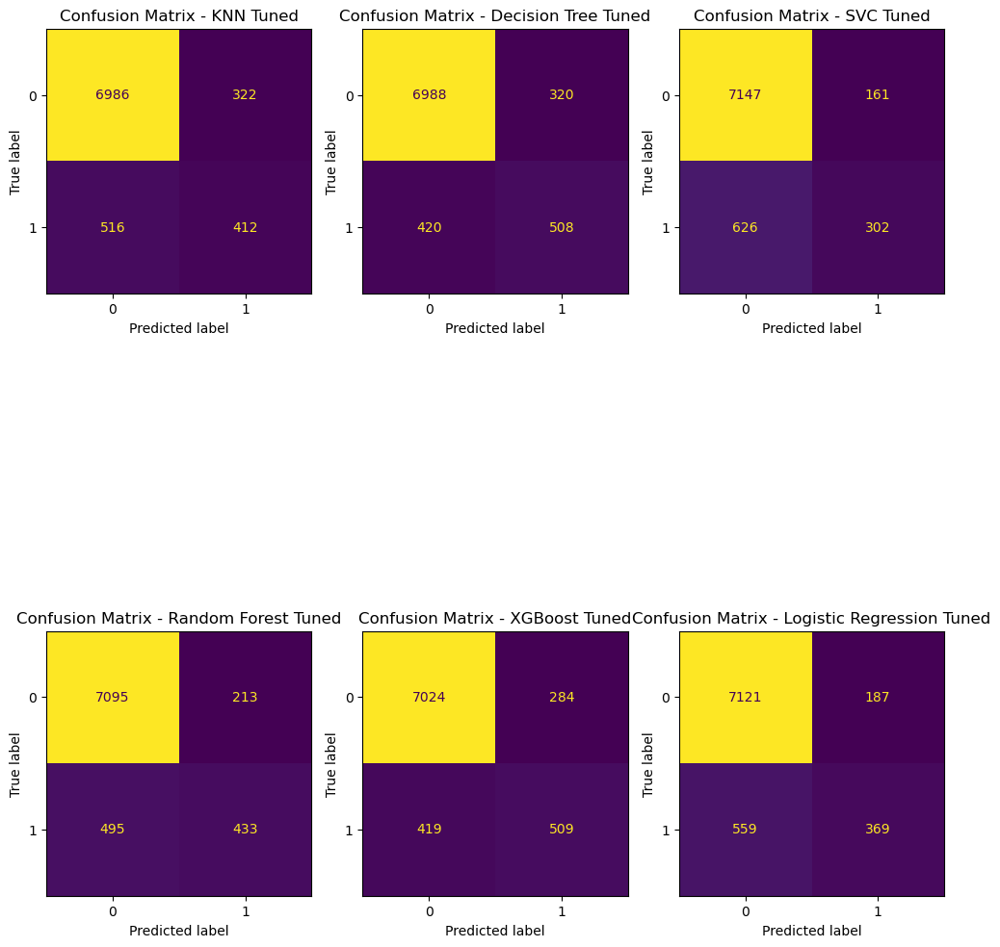

In [53]:
# Confusion Matrices
fig.clf()
fig, axes = plt.subplots(2, 3, figsize=(10, 15))  

# Flatten the axes array for easier iteration
axes = axes.flatten()

for ax, (name, conf_matrix) in zip(axes, conf_matrices.items()):
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=[0, 1])
    disp.plot(ax=ax, colorbar=False)
    ax.set_title(f'Confusion Matrix - {name}')

# Hide any unused subplots
for i in range(len(conf_matrices), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

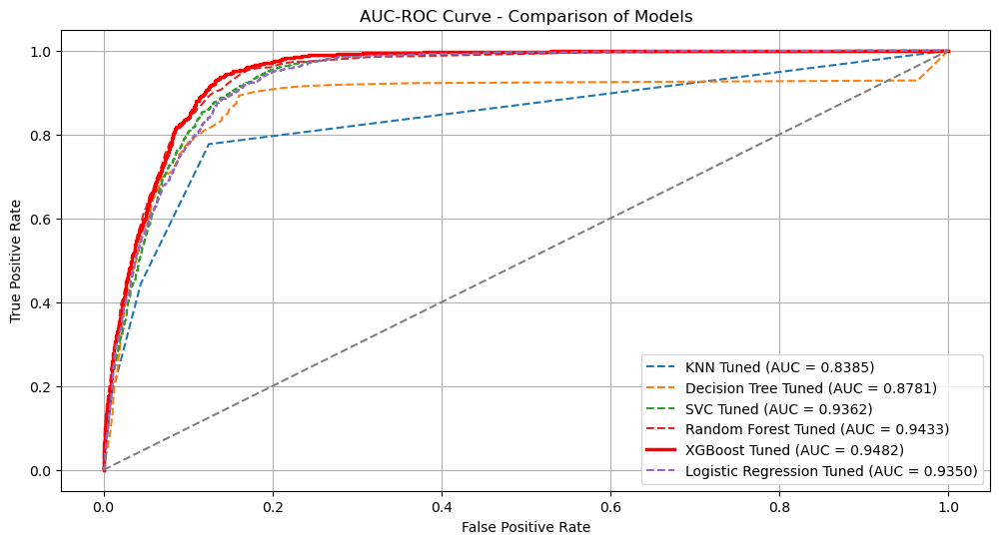


 Best model by ROC AUC: XGBoost Tuned with AUC = 0.9482


In [54]:
# --- Plotting ROC Curves ---
plt.figure(figsize = (12, 6))

# Find the best model by ROC AUC
best_roc_model = max(roc_data.items(), key = lambda x: x[1]['auc'])[0]

# Plot each model's ROC curve
for name, data in roc_data.items():
    if name == best_roc_model:
        plt.plot(data['fpr'], data['tpr'], label = f'{name} (AUC = {data["auc"]:.4f})', color = 'red', linewidth = 2.5)
    else:
        plt.plot(data['fpr'], data['tpr'], label = f'{name} (AUC = {data["auc"]:.4f})', linestyle = '--')

# Reference diagonal line
plt.plot([0, 1], [0, 1], linestyle = '--', color = 'gray')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve - Comparison of Models')
plt.legend(loc = 'lower right')
plt.grid(True)
plt.show()

# Print best model info
print(f"\n Best model by ROC AUC: {best_roc_model} with AUC = {roc_data[best_roc_model]['auc']:.4f}")


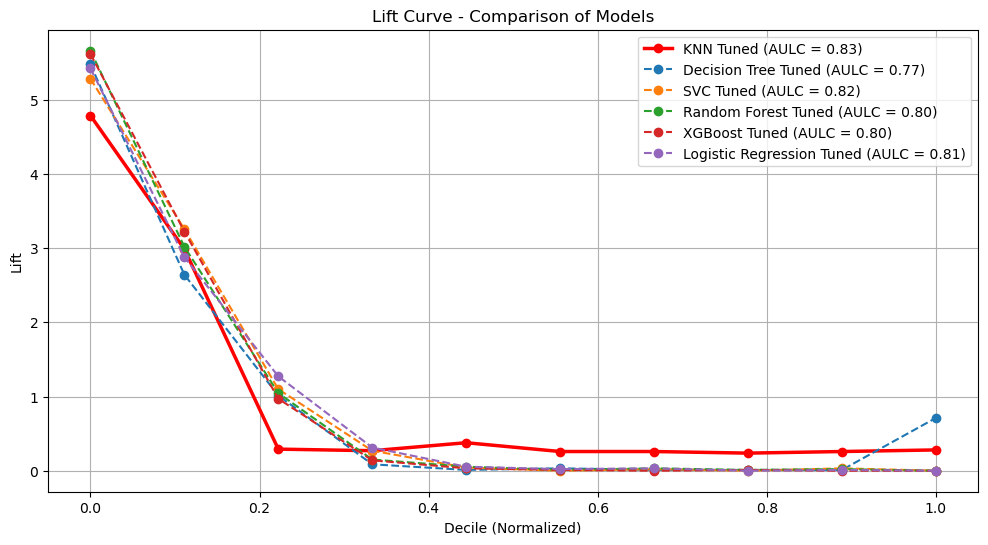

Normalized Area Under the Lift Curve (AULC) for each model:
KNN Tuned: 0.83
Decision Tree Tuned: 0.77
SVC Tuned: 0.82
Random Forest Tuned: 0.80
XGBoost Tuned: 0.80
Logistic Regression Tuned: 0.81

 Best model by AULC: KNN Tuned with AULC = 0.83


In [60]:
# --- Plotting Lift Curves ---
plt.figure(figsize = (12, 6))

# Dictionary to store normalized AULC values
aulc_values = {}

# Calculate AULC values
for name, lift_values in lift_data.items():
    deciles = np.linspace(0, 1, len(lift_values))  # Normalize x-axis
    aulc = auc(deciles, lift_values)
    aulc_values[name] = aulc

# Identify best model by AULC
best_model_name = max(aulc_values.items(), key=lambda x: x[1])[0]

# Plot all lift curves
for name, lift_values in lift_data.items():
    deciles = np.linspace(0, 1, len(lift_values))
    if name == best_model_name:
        plt.plot(deciles, lift_values, marker='o', label=f'{name} (AULC = {aulc_values[name]:.2f})', color='red', linewidth=2.5)
    else:
        plt.plot(deciles, lift_values, marker='o', label=f'{name} (AULC = {aulc_values[name]:.2f})', linestyle='--')

# Add labels, title, and legend
plt.xlabel('Decile (Normalized)')
plt.ylabel('Lift')
plt.title('Lift Curve - Comparison of Models')
plt.legend()
plt.grid(True)
plt.show()

# Print normalized AULC values for each model
print("Normalized Area Under the Lift Curve (AULC) for each model:")
for name, aulc in aulc_values.items():
    print(f"{name}: {aulc:.2f}")

print(f"\n Best model by AULC: {best_model_name} with AULC = {aulc_values[best_model_name]:.2f}")


To address the inherent class imbalance in the bank term deposit subscription dataset, SMOTENC was applied to oversample the minority class while preserving the integrity of categorical variables. This ensured that the models were trained on a balanced dataset that retained important categorical relationships. Following this, RandomizedSearchCV was employed for each model to perform thorough hyperparameter tuning, optimizing their predictive performance across a wide parameter space.

The Normalized Area Under the Lift Curve (AULC) was used as the primary metric to assess how well each model could prioritize likely subscribers—critical in direct marketing contexts where identifying high-probability customers for outreach can significantly increase campaign efficiency. Among the tuned models, K-Nearest Neighbors (KNN) achieved the highest AULC score of 0.83, indicating superior lift in early prediction ranks. This was closely followed by SVC (0.82), Logistic Regression (0.81), Random Forest and XGBoost (both 0.80), and Decision Tree (0.77).

These results demonstrate that, under balanced and optimized conditions, KNN is the most effective model for ranking term deposit subscribers—making it a strong candidate for deployment in targeted marketing strategies. The combination of SMOTENC balancing and rigorous hyperparameter tuning ensures that these insights are both robust and applicable in real-world decision-making

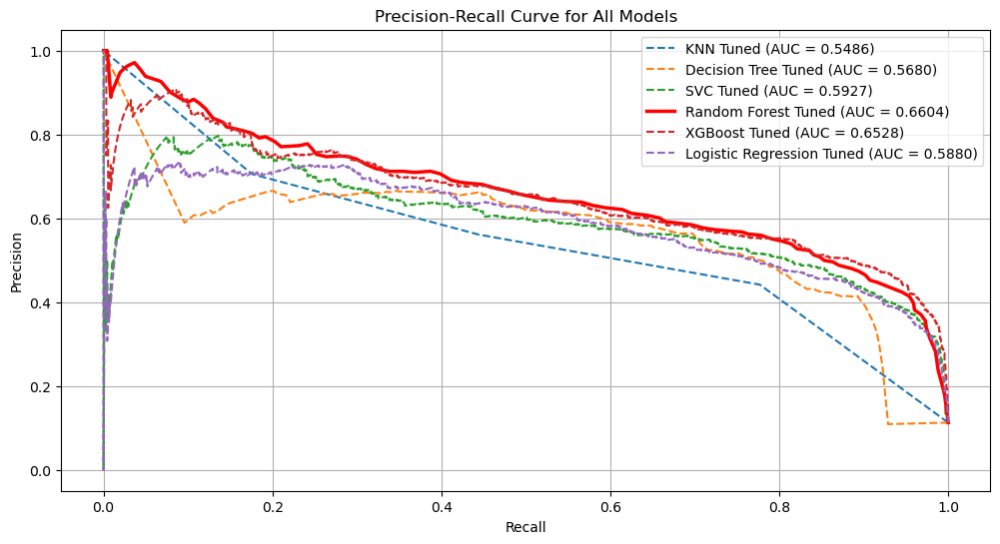

In [61]:
# Identify the best model by PR AUC
best_model_name = max(pr_data.items(), key = lambda x: x[1]['auc'])[0]
best_auc = pr_data[best_model_name]['auc']

# Precision-Recall Curves plot
plt.figure(figsize=(12, 6))

for name, data in pr_data.items():
    if name == best_model_name:
        plt.plot(data['recall'], data['precision'], label = f'{name} (AUC = {data["auc"]:.4f})', color = 'red', linewidth = 2.5)
    else:
        plt.plot(data['recall'], data['precision'], label = f'{name} (AUC = {data["auc"]:.4f})', linestyle = '--')

# Plot formatting
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for All Models')
plt.legend(loc = 'upper right')
plt.grid(True)
plt.show()


Recall: 0.6401
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      7308
           1       0.55      0.64      0.59       928

    accuracy                           0.90      8236
   macro avg       0.75      0.79      0.77      8236
weighted avg       0.91      0.90      0.90      8236



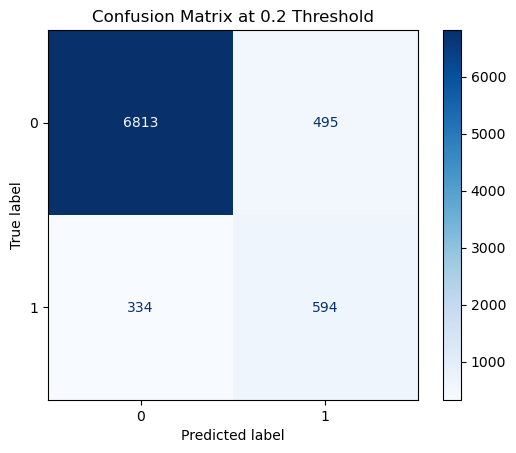

In [65]:
# Detect feature types
numerical_features = X_train.select_dtypes(include = ['int64', 'float64']).columns.tolist()
categorical_features = X_train.select_dtypes(include = ['object', 'category']).columns.tolist()

# Preprocessing
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown = 'ignore')

preprocessor = ColumnTransformer(
    transformers = [
        ('num', numeric_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

# Define base estimators
estimators = [
    ('rf', RandomForestClassifier(n_estimators = 100, class_weight = 'balanced', random_state = 42)),
    ('xgb', XGBClassifier(use_label_encoder = False, eval_metric = 'logloss', random_state = 42)),
    ('svc', SVC(probability = True, class_weight = 'balanced', random_state = 42)),
    ('dt', DecisionTreeClassifier(class_weight = 'balanced', random_state = 42)),
    ('knn', KNeighborsClassifier())
]

# Final estimator
final_estimator = LogisticRegression(max_iter = 1000, class_weight = 'balanced', solver = 'liblinear')

# Stacking model
stacked_model = StackingClassifier(
    estimators = estimators,
    final_estimator = final_estimator,
    passthrough = True,
    cv = 5,
    n_jobs = -1
)

# Pipeline
pipeline = ImbPipeline(steps = [
    ('preprocessing', preprocessor),
    ('smote', SMOTE(random_state = 42)),
    ('classifier', stacked_model)
])

# Fit
pipeline.fit(X_train, y_train)

# Predict with threshold
y_proba = pipeline.predict_proba(X_test)[:, 1]
y_pred_thresh = (y_proba >= 0.2).astype(int)

# Evaluation
print(f"Recall: {recall_score(y_test, y_pred_thresh):.4f}")
print(classification_report(y_test, y_pred_thresh))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_thresh)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = pipeline.classes_)
disp.plot(cmap = 'Blues')
plt.title('Confusion Matrix at 0.2 Threshold')
plt.show()


The stacked ensemble model—integrating Random Forest, XGBoost, SVC, Decision Tree, and K-Nearest Neighbors as base learners with a Logistic Regression meta-classifier—was evaluated to predict whether a client would subscribe to a term deposit as part of a Portuguese bank’s direct marketing campaign. The model was trained using SMOTENC to handle class imbalance and mixed data types, ensuring that categorical relationships were respected while oversampling the minority class (subscribed clients). With a threshold tuned to prioritize recall for the minority class ("yes"), the model achieved a recall of 0.64, meaning it correctly identified 64% of clients who were likely to subscribe.

The classifier maintained a precision of 0.55 for positive predictions, yielding an F1-score of 0.59 for the "yes" class. The overall accuracy was 90%, but more importantly for this campaign-focused task, the macro-average F1-score was 0.77, reflecting balanced performance across both classes despite the underlying imbalance.

This model is well-suited for marketing applications where maximizing customer conversion is key. A higher recall ensures that more potential subscribers are flagged for follow-up, which is typically more acceptable than missing likely subscribers (false negatives). As a next step, applying PolynomialFeatures to the numeric variables before oversampling could help the model capture non-linear patterns in client behavior, potentially improving subscription predictions further

##### Questions